In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from tqdm import tqdm
import tensorflow as tf
import cv2
import pickle
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import time
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, LSTM, Input, Embedding, Conv2D,Concatenate,Flatten,Add,Dropout,GRU
import random
import datetime
from nltk.translate.bleu_score import sentence_bleu
from math import log
import torch
from torchvision import transforms
from transformers import ViTModel, ViTFeatureExtractor
import os
from PIL import Image
import numpy as np
import cv2
import warnings
warnings.filterwarnings('ignore')

In [ ]:
train_dataset = pd.read_csv('/kaggle/input/data-split-csv/Train_Data.csv')
cv_dataset = pd.read_csv('/kaggle/input/data-split-csv/CV_Data.csv')
test_dataset = pd.read_csv('/kaggle/input/data-split-csv/Test_Data.csv')
X_train = train_dataset['Person_id']
y_train = train_dataset['Report']

X_cv = cv_dataset['Person_id']
y_cv = cv_dataset['Report']

X_test = test_dataset['Person_id']
y_test = test_dataset['Report']

max_capt_len = 153
pad_size = max_capt_len 

In [ ]:
import os
import re
import cv2
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
sns.set_style("whitegrid")
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
warnings.filterwarnings('ignore')
import xml.etree.ElementTree as ET
from wordcloud import WordCloud, ImageColorGenerator
cwd = os.getcwd()
import tarfile
images = tarfile.open('/kaggle/input/images-reports/NLMCXR_png.tgz')
images.extractall(cwd+'/xray_images/')

In [ ]:
# Print first few reports to check the data
print("First 5 reports:")
for i in range(5):
    print(f"\nReport {i+1}:")
    print(train_dataset['Report'][i])
    # Split report into words and get unique word count
    words = set(str(train_dataset['Report'][i]).split())
    print(f"Unique words: {len(words)}")

# Calculate max vocabulary size per report
max_len = max([len(set(str(report).split())) for report in train_dataset['Report']])
print(f"\nMaximum vocabulary size in a single report: {max_len}")

In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from transformers import CLIPProcessor, CLIPModel
from tqdm import tqdm
import cv2

# Cài đặt thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load mô hình CLIP và feature extractor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_model = clip_model.to(device)
clip_model.eval()

feature_extractor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

def load_image(img_name, base_path="/kaggle/working/xray_images"):
    filename = os.path.basename(img_name.strip())
    full_path = os.path.join(base_path, filename)

    try:
        image = Image.open(full_path)
    except FileNotFoundError:
        print(f"⚠️ Không tìm thấy ảnh: {full_path}")
        return None

    image = image.resize((224, 224))
    image = np.asarray(image.convert("RGB"))
    image = cv2.resize(image, (224, 224))
    return image

def extract_img_feature(image1_path, image2_path, base_path="/kaggle/working/xray_images"):
    def extract_single_feature(image_path):
        image = load_image(image_path, base_path)
        if image is None:
            return None

        inputs = feature_extractor(images=image, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}

        with torch.no_grad():
            outputs = clip_model.get_image_features(**inputs)
        
        return outputs.squeeze(0)  # (hidden_dim,)
    
    img1_features = extract_single_feature(image1_path)
    img2_features = extract_single_feature(image2_path)

    if img1_features is not None and img2_features is not None:
        combined_feature = np.concatenate([img1_features.cpu().numpy(), img2_features.cpu().numpy()], axis=-1)
        return combined_feature
    else:
        print(f"Không thể trích xuất đặc trưng cho {image1_path} hoặc {image2_path}")
        return None

def extract_features_for_datasets(train_images, cv_images, test_images, base_path):
    X_train, X_cv, X_test = [], [], []

    for index, row in tqdm(train_images.iterrows(), total=train_images.shape[0], desc="Train"):
        feature = extract_img_feature(row['Image1'], row['Image2'], base_path)
        if feature is not None:
            X_train.append(feature)

    for index, row in tqdm(cv_images.iterrows(), total=cv_images.shape[0], desc="CV"):
        feature = extract_img_feature(row['Image1'], row['Image2'], base_path)
        if feature is not None:
            X_cv.append(feature)

    for index, row in tqdm(test_images.iterrows(), total=test_images.shape[0], desc="Test"):
        feature = extract_img_feature(row['Image1'], row['Image2'], base_path)
        if feature is not None:
            X_test.append(feature)

    return np.array(X_train), np.array(X_cv), np.array(X_test)

In [ ]:
train_images = train_dataset[['Person_id', 'Image1', 'Image2']]  
cv_images = cv_dataset[['Person_id', 'Image1', 'Image2']]
test_images = test_dataset[['Person_id', 'Image1', 'Image2']]

X_train, X_cv, X_test = extract_features_for_datasets(train_images, cv_images, test_images, base_path='/kaggle/working/xray_images')

print(f"X_train shape: {X_train.shape}")
print(f"X_cv shape: {X_cv.shape}")
print(f"X_test shape: {X_test.shape}")

In [ ]:
import re
from tqdm import tqdm
from transformers import AutoTokenizer

# 1. Hàm làm sạch text
def clean_text_internal(text):
    text = str(text)
    text = re.sub(r'[^\w\s.]', '', text)  # Giữ chữ, khoảng trắng và dấu chấm
    text = ' '.join(text.split())
    return text

# 2. Làm sạch toàn bộ báo cáo
try:
    all_reports_cleaned = [clean_text_internal(report) for report in y_train] + \
                          [clean_text_internal(report) for report in y_cv] + \
                          [clean_text_internal(report) for report in y_test]
    print(f"✅ Collected {len(all_reports_cleaned)} cleaned reports.")
except NameError:
    print("❌ Error: y_train, y_cv, y_test not found.")
    all_reports_cleaned = []

# 3. Tách từ riêng từ báo cáo (dùng tách trắng đơn giản)
data_report_vocab = set()
if all_reports_cleaned:
    for report in tqdm(all_reports_cleaned, desc="📃 Extracting words from reports"):
        words = report.split()
        data_report_vocab.update(words)

print(f"🧠 Report Vocab Size: {len(data_report_vocab)}")

# 4. Tải mô hình BioBART từ Hugging Face (sử dụng đúng tên mô hình)
biobart_tokenizer = AutoTokenizer.from_pretrained("GanjinZero/biobart-v2-large")  # Đảm bảo mô hình này đúng

biobart_vocab = set(biobart_tokenizer.get_vocab().keys())
print(f"🧬 BioBART Vocab Size: {len(biobart_vocab)}")

# 5. Tìm giao nhau giữa vocab từ báo cáo và vocab của BioBART
intersection_vocab = data_report_vocab.intersection(biobart_vocab)
print(f"🔗 Intersected Vocab Size: {len(intersection_vocab)}")

# (Optional) In vài từ mẫu
print("🔍 Some intersected tokens:", list(intersection_vocab))


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
# Removed GPT-2 imports, BART imports are in Cell 1
from transformers import BartTokenizer, BartForConditionalGeneration, BartConfig

class MLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.dropout1 = nn.Dropout(0.1)
        self.fc2 = nn.Linear(hidden_dim, output_dim)
        self.layer_norm = nn.LayerNorm(output_dim)

    def forward(self, x):
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.layer_norm(x)
        return x

# --- Load BioBART Tokenizer and Model ---

biobart_model_name = "GanjinZero/biobart-base" # Or GanjinZero/biobart-large
print(f"Loading BioBART tokenizer: {biobart_model_name}")
biobart_tokenizer = BartTokenizer.from_pretrained(biobart_model_name)

print(f"Loading BioBART model: {biobart_model_name}")
biobart_model = BartForConditionalGeneration.from_pretrained(biobart_model_name)

# --- Initialize MLP --- 
# Get the hidden size (d_model) from the loaded BioBART model
mlp_output_dim = biobart_model.config.d_model
print(f"Initializing MLP with output dimension matching BioBART hidden size: {mlp_output_dim}")

# Input dimension assumes concatenated ViT features (768 * 2 = 1536)
mlp_input_dim = 1024
mlp_hidden_dim = 1024 # Can be adjusted

mlp = MLP(input_dim=mlp_input_dim, hidden_dim=mlp_hidden_dim, output_dim=mlp_output_dim)

# --- Setup Device ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mlp.to(device)
biobart_model.to(device)
print(f"MLP and BioBART models moved to device: {device}")

# --- Display Tokenizer Info (Optional) ---
print(f"BioBART Tokenizer Vocabulary Size: {biobart_tokenizer.vocab_size}")
print(f"BioBART Pad Token: {biobart_tokenizer.pad_token} (ID: {biobart_tokenizer.pad_token_id})")
print(f"BioBART BOS Token: {biobart_tokenizer.bos_token} (ID: {biobart_tokenizer.bos_token_id})")
print(f"BioBART EOS Token: {biobart_tokenizer.eos_token} (ID: {biobart_tokenizer.eos_token_id})")
# BART typically uses EOS as decoder_start_token_id
print(f"BioBART Decoder Start Token ID: {biobart_model.config.decoder_start_token_id} (Often same as EOS ID)")

In [ ]:
y_train[:10]

In [ ]:
from torch.utils.data import TensorDataset, DataLoader
import re
import numpy as np # Ensure numpy is imported

# Clean text function (remains the same)
def clean_text(text):
    # Remove special characters and extra whitespace
    text = str(text) # Ensure text is string
    text = re.sub(r'[^\w\s.]', '', text)  # Keep only words, spaces and periods
    text = ' '.join(text.split())  # Remove extra whitespace
    return text

# Clean and preprocess the reports
print("Cleaning reports...")
# Ensure y_train etc. are loaded from cell 2
try:
    y_train_cleaned = [clean_text(report) for report in y_train]
    y_cv_cleaned = [clean_text(report) for report in y_cv]
    y_test_cleaned = [clean_text(report) for report in y_test]
except NameError:
    print("Error: y_train, y_cv, or y_test not defined. Execute Cell 2.")
    # Assign empty lists to prevent further errors if Cell 2 wasn't run
    y_train_cleaned, y_cv_cleaned, y_test_cleaned = [], [], []


# Print sample reports after cleaning
print("\nSample reports after cleaning:")
for i in range(min(3, len(y_train_cleaned))):
    print(f"\nReport {i+1}:")
    print(y_train_cleaned[i])

# Normalize image features (remains the same)
# Ensure X_train, X_cv, X_test from ViT extraction (Cell 6) are available
print("\nNormalizing image features...")
# Check if features exist and are numpy arrays
def normalize_features(features, name):
    if name in locals() or name in globals():
        data = locals().get(name) or globals().get(name)
        if isinstance(data, np.ndarray) and data.size > 0:
            mean, std = data.mean(), data.std()
            # Avoid division by zero
            std = std if std > 1e-6 else 1.0
            print(f"Normalizing {name}...")
            return (data - mean) / std
        else:
            print(f"Warning: {name} not found, is not a numpy array, or is empty. Skipping normalization.")
            # Return empty array matching expected dimensions if possible
            return np.empty((0, mlp_input_dim if 'mlp_input_dim' in locals() else 1024))
    else:
        print(f"Warning: {name} not found. Skipping normalization.")
        return np.empty((0, mlp_input_dim if 'mlp_input_dim' in locals() else 1024))

# Use the function (assuming X_train, X_cv, X_test were defined in Cell 6)
# Need to re-assign the result back to the original variable names
if 'X_train' in locals() or 'X_train' in globals(): X_train = normalize_features(X_train, 'X_train')
if 'X_cv' in locals() or 'X_cv' in globals(): X_cv = normalize_features(X_cv, 'X_cv')
if 'X_test' in locals() or 'X_test' in globals(): X_test = normalize_features(X_test, 'X_test')


# Print statistics of normalized features
print("\nFeature statistics after normalization (if performed):")
if 'X_train' in locals() and isinstance(X_train, np.ndarray) and X_train.size > 0: print(f"X_train - mean: {X_train.mean():.4f}, std: {X_train.std():.4f}")
if 'X_cv' in locals() and isinstance(X_cv, np.ndarray) and X_cv.size > 0: print(f"X_cv - mean: {X_cv.mean():.4f}, std: {X_cv.std():.4f}")
if 'X_test' in locals() and isinstance(X_test, np.ndarray) and X_test.size > 0: print(f"X_test - mean: {X_test.mean():.4f}, std: {X_test.std():.4f}")


# Convert features to tensors
print("\nConverting features to tensors...")
# Use .copy() to avoid potential negative stride issues after normalization
def features_to_tensor(features, name):
     if name in locals() or name in globals():
        data = locals().get(name) or globals().get(name)
        if isinstance(data, np.ndarray) and data.size > 0:
             # Ensure data owns its memory before converting to tensor
             return torch.tensor(data.copy()).float()
        else:
             print(f"Warning: {name} is empty or not a numpy array. Creating empty tensor.")
             return torch.empty((0, mlp_input_dim if 'mlp_input_dim' in locals() else 1024)).float()
     else:
        print(f"Warning: {name} not found. Creating empty tensor.")
        return torch.empty((0, mlp_input_dim if 'mlp_input_dim' in locals() else 1024)).float()

X_train_tensor = features_to_tensor(X_train, 'X_train')
X_cv_tensor = features_to_tensor(X_cv, 'X_cv')
X_test_tensor = features_to_tensor(X_test, 'X_test')


# --- Tokenize reports using BioBART tokenizer ---
print("\nTokenizing reports with BioBART tokenizer...")
max_length = 150 # Adjust as needed, consider BioBART's max positions (1024 for base)

# Tokenize for decoder labels.
# The BartForConditionalGeneration model handles the decoder input shifting internally when labels are provided.
# We just need to tokenize the text including BOS/EOS tokens.
# Handle potentially empty lists
y_train_tensor = biobart_tokenizer(
    y_train_cleaned,
    add_special_tokens=True, # Adds BOS and EOS
    truncation=True,
    max_length=max_length,
    padding='max_length',
    return_tensors='pt' # Return PyTorch tensors directly
)["input_ids"] if y_train_cleaned else torch.empty((0, max_length)).long()

y_cv_tensor = biobart_tokenizer(
    y_cv_cleaned,
    add_special_tokens=True,
    truncation=True,
    max_length=max_length,
    padding='max_length',
    return_tensors='pt'
)["input_ids"] if y_cv_cleaned else torch.empty((0, max_length)).long()

y_test_tensor = biobart_tokenizer(
    y_test_cleaned,
    add_special_tokens=True,
    truncation=True,
    max_length=max_length,
    padding='max_length',
    return_tensors='pt'
)["input_ids"] if y_test_cleaned else torch.empty((0, max_length)).long()


# Create datasets and dataloaders
batch_size = 16 # Adjust batch size based on GPU memory

# Check for empty tensors before creating datasets
if X_train_tensor.shape[0] > 0 and y_train_tensor.shape[0] > 0:
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
else:
    print("Warning: Training data tensors are empty. Cannot create training DataLoader.")
    train_dataset = None
    train_loader = None

if X_cv_tensor.shape[0] > 0 and y_cv_tensor.shape[0] > 0:
    cv_dataset = TensorDataset(X_cv_tensor, y_cv_tensor)
    cv_loader = DataLoader(cv_dataset, batch_size=batch_size, shuffle=False)
else:
    print("Warning: Validation data tensors are empty. Cannot create validation DataLoader.")
    cv_dataset = None
    cv_loader = None

if X_test_tensor.shape[0] > 0 and y_test_tensor.shape[0] > 0:
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
else:
    print("Warning: Test data tensors are empty. Cannot create test DataLoader.")
    test_dataset = None
    test_loader = None


# Print dataset information
print("\nDataset sizes:")
print(f"Training: {len(train_dataset) if train_dataset else 0} samples")
print(f"Validation: {len(cv_dataset) if cv_dataset else 0} samples")
print(f"Test: {len(test_dataset) if test_dataset else 0} samples")

# Print sample of tokenized and decoded text
print("\nSample tokenization check (using BioBART tokenizer):")
sample_idx = 0
if train_dataset and len(y_train_cleaned) > sample_idx:
    print("Original text:", y_train_cleaned[sample_idx])
    print("Tokenized IDs:", y_train_tensor[sample_idx].tolist()[:50]) # First 50 IDs
    decoded = biobart_tokenizer.decode(y_train_tensor[sample_idx], skip_special_tokens=True)
    print("Decoded back:", decoded.strip()) # Use strip() to remove potential leading/trailing spaces
    # Check padding
    print(f"Pad token ID used: {biobart_tokenizer.pad_token_id}")
    print(f"Attention mask check (implicit in DataLoader/Model): Model expects 0 for padding, 1 otherwise.")

# Check tensor shapes
print("\nTensor shapes:")
print(f"X_train_tensor: {X_train_tensor.shape}")
print(f"y_train_tensor: {y_train_tensor.shape}")

# Check first batch from dataloader
if train_loader and len(train_loader) > 0:
    sample_batch_x, sample_batch_y = next(iter(train_loader))
    print("\nFirst batch shapes:")
    print(f"Input batch (X): {sample_batch_x.shape}") # Image features
    print(f"Target batch (Y): {sample_batch_y.shape}") # Tokenized reports
else:
    print("\nTrain loader is empty or None, cannot check batch shapes.")

print("\nPreprocessing with BioBART tokenizer complete.")


In [ ]:
from tqdm import tqdm
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset # Ensure these are imported if not already
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Ensure models (mlp, biobart_model) and tokenizer (biobart_tokenizer) are defined from Cell 7
# Ensure device is defined from Cell 7
# Ensure dataloaders (train_loader, cv_loader) are defined from Cell 9

def train_step(mlp, biobart_model, inputs, labels, optimizer, device):
    """Performs a single training step."""
    mlp.train()
    biobart_model.train()

    # Move data to the correct device
    inputs = inputs.to(device) # Image features
    labels = labels.to(device) # Target report tokens

    optimizer.zero_grad()

    # --- Forward pass ---
    # 1. Get image embeddings from MLP
    embedded_input = mlp(inputs) # Shape: (batch_size, mlp_output_dim)

    # 2. Prepare for BioBART decoder
    # Treat the image embedding as the initial context for the decoder.
    # Expand it to match the sequence length of the labels for teacher forcing.
    # Shape needs to be (batch_size, sequence_length, hidden_size)
    batch_size, seq_len = labels.size()
    # Unsqueeze adds the sequence length dimension (initially 1)
    # Expand copies the embedding across the sequence length dimension
    decoder_inputs_embeds = embedded_input.unsqueeze(1).expand(-1, seq_len, -1)

    # 3. Create attention mask for labels (ignore padding tokens)
    # This mask tells the decoder which label tokens to pay attention to (non-pad ones)
    decoder_attention_mask = (labels != biobart_tokenizer.pad_token_id).long().to(device)

    # 4. Forward pass through BioBART
    # Provide labels for teacher-forcing and internal loss calculation.
    # The model automatically creates decoder_input_ids (shifted labels) when labels are provided.
    outputs = biobart_model(
        inputs_embeds=decoder_inputs_embeds, # Feeds the image context to the decoder start
        labels=labels,                       # Target tokens for teacher forcing & loss
        decoder_attention_mask=decoder_attention_mask # Mask padding in the target sequence
        # encoder_outputs=None,              # Not using encoder outputs directly here
        # attention_mask=None                # No separate encoder attention mask needed here
    )

    loss = outputs.loss # The model calculates the cross-entropy loss internally

    # --- Backward pass ---
    loss.backward()

    # Gradient clipping (optional but helps stabilize training)
    torch.nn.utils.clip_grad_norm_(list(mlp.parameters()) + list(biobart_model.parameters()), max_norm=1.0)

    optimizer.step()

    return loss.item()

def validate(mlp, biobart_model, val_loader, device):
    """Performs validation on the validation set."""
    mlp.eval()      # Set MLP to evaluation mode
    biobart_model.eval() # Set BioBART to evaluation mode
    total_val_loss = 0
    num_batches = 0

    with torch.no_grad(): # Disable gradient calculations for validation
        for input_batch, label_batch in val_loader:
            # Move data to device
            input_batch = input_batch.to(device)
            label_batch = label_batch.to(device)

            # --- Forward pass (similar to train_step but without backprop) ---
            embedded_input = mlp(input_batch)
            batch_size, seq_len = label_batch.size()
            decoder_inputs_embeds = embedded_input.unsqueeze(1).expand(-1, seq_len, -1)
            decoder_attention_mask = (label_batch != biobart_tokenizer.pad_token_id).long().to(device)

            outputs = biobart_model(
                inputs_embeds=decoder_inputs_embeds,
                labels=label_batch,
                decoder_attention_mask=decoder_attention_mask
            )
            total_val_loss += outputs.loss.item()
            num_batches += 1

    if num_batches == 0:
        return float('inf') # Avoid division by zero if val_loader is empty
    return total_val_loss / num_batches

# --- Training Setup ---

# Initialize optimizer
# Use different learning rates for the randomly initialized MLP and the pre-trained BioBART
lr_mlp = 1e-4
lr_bart = 5e-5 # A common starting point for fine-tuning BART/Transformer models

optimizer = optim.AdamW([
    {'params': mlp.parameters(), 'lr': lr_mlp},
    {'params': biobart_model.parameters(), 'lr': lr_bart}
], weight_decay=0.01)

# Learning rate scheduler (reduces LR if validation loss plateaus)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

# Training loop parameters
epochs = 20 # Adjust number of epochs as needed
best_val_loss = float('inf')
patience = 5 # Early stopping patience: stop after `patience` epochs with no improvement
patience_counter = 0
checkpoint_path = 'vit_biobart_best_model.pt' # Path to save the best model

# Check if dataloaders exist (defined in Cell 9)
if 'train_loader' not in locals() or train_loader is None or \
   'cv_loader' not in locals() or cv_loader is None:
    print("Error: Training or validation dataloader is missing or None. Cannot start training.")
    # Optionally, add code here to recreate dataloaders if needed, or exit
else:
    print("Starting training loop...")
    # Clear GPU cache before starting training
    if device == torch.device("cuda"):
        torch.cuda.empty_cache()

    for epoch in range(epochs):
        total_train_loss = 0
        num_train_batches = 0
        # Setup progress bar for training
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs}', leave=False)

        # --- Training Phase ---
        mlp.train() # Set models to training mode
        biobart_model.train()

        for batch_idx, (input_batch, label_batch) in enumerate(progress_bar):
            try:
                # Perform a training step
                loss = train_step(mlp, biobart_model, input_batch, label_batch, optimizer, device)
                total_train_loss += loss
                num_train_batches += 1

                # Update progress bar description with current loss
                progress_bar.set_postfix({'train_loss': f'{loss:.4f}'})

                # --- Generate Sample Text Periodically ---
                # Generate less frequently than every batch to save time
                if batch_idx > 0 and batch_idx % 200 == 0: # Adjust frequency as needed
                    mlp.eval() # Switch to eval mode for generation
                    biobart_model.eval()
                    with torch.no_grad():
                        # Use the first item of the current batch for generation
                        sample_input = input_batch[:1].to(device) # Take first item, ensure on device
                        sample_embed = mlp(sample_input) # Get MLP embedding shape: (1, hidden_size)
                        # Prepare for generate: needs shape (batch_size, seq_len, hidden_size)
                        sample_embed_gen = sample_embed.unsqueeze(1) # Shape: (1, 1, hidden_size)

                        # Generate using BioBART's generate method
                        gen_ids = biobart_model.generate(
                            inputs_embeds=sample_embed_gen, # Feed MLP output as decoder start context
                            max_length=100,          # Max length of the generated sequence
                            num_beams=4,             # Use beam search for potentially better quality
                            early_stopping=True,     # Stop beams early if EOS is reached
                            # decoder_start_token_id=biobart_model.config.decoder_start_token_id, # Use model's default
                            pad_token_id=biobart_tokenizer.pad_token_id, # Important for generation
                            eos_token_id=biobart_tokenizer.eos_token_id,   # Important for generation
                            # --- Alternative: Sampling Parameters (if not using beam search) ---
                            # do_sample=True,
                            # top_k=50,
                            # top_p=0.9,
                            # temperature=0.7,
                            # no_repeat_ngram_size=2, # Helps prevent repetitive phrases
                        )
                        # Decode the generated IDs back to text
                        generated_text = biobart_tokenizer.decode(gen_ids[0], skip_special_tokens=True)
                        print(f"\n--- Sample generation (Epoch {epoch+1}, Batch {batch_idx}) ---")
                        print(f"{generated_text.strip()}") # Print cleaned generated text
                        print("----------------------------------------------------------\n")
                    # Return models to training mode after generation
                    mlp.train()
                    biobart_model.train()

                # Clear GPU cache periodically to prevent OOM errors, especially with large models/batches
                if batch_idx > 0 and batch_idx % 50 == 0 and device == torch.device("cuda"):
                    torch.cuda.empty_cache()

            except RuntimeError as e:
                # Handle CUDA Out-of-Memory errors gracefully
                if "out of memory" in str(e):
                    print(f"\nWarning: CUDA OOM Error encountered in batch {batch_idx}. Trying to recover...")
                    torch.cuda.empty_cache() # Free memory
                    optimizer.zero_grad() # Clear potentially corrupted gradients
                    print("Skipping batch.")
                    continue # Skip to the next batch
                else:
                    # Re-raise other runtime errors
                    print(f"Runtime Error in batch {batch_idx}: {str(e)}")
                    raise e

        # --- Validation Phase ---
        # Calculate average training loss for the epoch
        avg_train_loss = total_train_loss / num_train_batches if num_train_batches > 0 else float('inf')
        # Calculate validation loss
        avg_val_loss = validate(mlp, biobart_model, cv_loader, device)

        # Close the training progress bar for the epoch
        progress_bar.close()

        print(f"\nEpoch {epoch + 1}/{epochs} Summary:")
        print(f"  Average Training Loss: {avg_train_loss:.4f}")
        print(f"  Validation Loss:       {avg_val_loss:.4f}")

        # --- Learning Rate Scheduling & Checkpointing ---
        # Adjust learning rate based on validation loss
        scheduler.step(avg_val_loss)

        # Check if validation loss improved
        if avg_val_loss < best_val_loss:
            print(f"  Validation loss improved ({best_val_loss:.4f} --> {avg_val_loss:.4f}). Saving model...")
            best_val_loss = avg_val_loss
            patience_counter = 0 # Reset patience counter
            # Save model checkpoint (includes model states, optimizer, scheduler, epoch, losses)
            torch.save({
                'epoch': epoch,
                'mlp_state_dict': mlp.state_dict(),
                'biobart_state_dict': biobart_model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'train_loss': avg_train_loss,
                'val_loss': avg_val_loss,
                'biobart_model_name': biobart_model_name # Store model name for reproducibility
            }, checkpoint_path)
            print(f"  Model saved to {checkpoint_path}")
        else:
            patience_counter += 1
            print(f"  Validation loss did not improve. Patience: {patience_counter}/{patience}")
            # Check for early stopping
            if patience_counter >= patience:
                print(f"\nEarly stopping triggered after {epoch + 1} epochs due to lack of improvement.")
                break # Exit the training loop

    print("\nTraining finished.")

# --- Optional: Load Best Model ---
# After training (or if interrupted), you might want to load the best performing model
# print(f"\nLoading best model from {checkpoint_path} for evaluation...")
# if os.path.exists(checkpoint_path):
#     checkpoint = torch.load(checkpoint_path, map_location=device)
#     # Load model states
#     mlp.load_state_dict(checkpoint['mlp_state_dict'])
#     biobart_model.load_state_dict(checkpoint['biobart_state_dict'])
#     # Optionally load optimizer and scheduler if resuming training
#     # optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#     # scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
#     print(f"Best model (Epoch {checkpoint['epoch']+1}) loaded with Val Loss: {checkpoint['val_loss']:.4f}")
# else:
#     print(f"Checkpoint file not found at {checkpoint_path}. Using the current model state.")


In [27]:
# Evaluation function using BioBART
import torch
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from nltk.translate.meteor_score import meteor_score
from nltk.tokenize import word_tokenize
from tqdm import tqdm
import numpy as np

# Ensure NLTK resources are downloaded
import nltk
# Download required NLTK resources
print("Downloading NLTK punkt tokenizer...")
nltk.download('punkt', quiet=True)
print("Downloading NLTK wordnet...")
nltk.download('wordnet', quiet=True)

def evaluate_model(mlp, biobart_model, test_loader, biobart_tokenizer, device):
    """Evaluates the model on the test set using BLEU, METEOR, and ROUGE metrics."""
    
    # Ensure models are in evaluation mode
    mlp.eval()
    biobart_model.eval()
    
    generated_texts = []
    reference_texts = []
    
    print("\nStarting evaluation on the test set...")
    # Disable gradient calculations
    with torch.no_grad():
        progress_bar = tqdm(test_loader, desc='Evaluating', leave=False)
        for input_batch, label_batch in progress_bar:
            # Move data to the evaluation device
            input_batch = input_batch.to(device)
            # label_batch remains on CPU for decoding references easily
            
            # --- Generate Predictions --- 
            # 1. Get image embedding from MLP
            embedded_input = mlp(input_batch) # Shape: (batch_size, hidden_size)
            # Prepare for generate: needs shape (batch_size, seq_len, hidden_size)
            embedded_input_gen = embedded_input.unsqueeze(1) # Shape: (batch_size, 1, hidden_size)
            
            try:
                # 2. Generate text using BioBART
                outputs = biobart_model.generate(
                    inputs_embeds=embedded_input_gen,
                    max_length=153, # Max length for generated report (adjust if needed)
                    num_beams=4,
                    early_stopping=True,
                    pad_token_id=biobart_tokenizer.pad_token_id,
                    eos_token_id=biobart_tokenizer.eos_token_id,
                    # Use model's default decoder_start_token_id
                )
                
                # --- Decode and Store --- 
                # Decode generated sequences
                batch_generated_texts = biobart_tokenizer.batch_decode(outputs, skip_special_tokens=True)
                # Decode reference sequences (original labels)
                batch_reference_texts = biobart_tokenizer.batch_decode(label_batch, skip_special_tokens=True)
                
                # Clean up any extra spaces and store
                for gen_text, ref_text in zip(batch_generated_texts, batch_reference_texts):
                    generated_texts.append(gen_text.strip())
                    reference_texts.append(ref_text.strip())
            
            except RuntimeError as e:
                if "out of memory" in str(e):
                    print(f"\nCUDA OOM during evaluation. Skipping batch.")
                    torch.cuda.empty_cache()
                    continue
                else:
                    print(f"Runtime Error during evaluation: {str(e)}")
                    raise e # Re-raise other errors
            
            # Clear GPU memory periodically if needed
            if device == torch.device("cuda") and progress_bar.n % 20 == 0: # Every 20 batches
                 torch.cuda.empty_cache()
        
        progress_bar.close()

    # --- Calculate Metrics --- 
    if not generated_texts or not reference_texts:
        print("Evaluation failed: No texts were generated or references found.")
        return
        
    # 1. BLEU Scores
    print("\nCalculating BLEU scores...")
    # Tokenize texts for BLEU calculation
    generated_tokens = [word_tokenize(text.lower()) for text in generated_texts]
    # Reference tokens need to be a list of lists for corpus_bleu
    reference_tokens = [[word_tokenize(text.lower())] for text in reference_texts]
    
    # Use smoothing function for robustness, especially for shorter texts or smaller test sets
    smoothing = SmoothingFunction().method1 
    bleu1 = corpus_bleu(reference_tokens, generated_tokens, weights=(1.0, 0, 0, 0), smoothing_function=smoothing)
    bleu2 = corpus_bleu(reference_tokens, generated_tokens, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothing)
    bleu3 = corpus_bleu(reference_tokens, generated_tokens, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothing)
    bleu4 = corpus_bleu(reference_tokens, generated_tokens, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothing)
    
    print(f"  BLEU-1: {bleu1:.4f}")
    print(f"  BLEU-2: {bleu2:.4f}") 
    print(f"  BLEU-3: {bleu3:.4f}")
    print(f"  BLEU-4: {bleu4:.4f}")
    
    # 2. METEOR Score
    print("\nCalculating METEOR score...")
    # NLTK's meteor_score expects tokenized references and hypotheses
    meteor_scores = [meteor_score([ref[0]], gen) for ref, gen in zip(reference_tokens, generated_tokens)]
    avg_meteor = np.mean(meteor_scores) # Use numpy for mean calculation
    print(f"  METEOR: {avg_meteor:.4f}")
    
    # 3. ROUGE Scores
    print("\nCalculating ROUGE scores...")
    rouge1_scores = []
    rouge2_scores = []
    rouge3_scores = []
    rouge4_scores = []
    rougeL_scores = []
    
    for ref, gen in zip(reference_tokens, generated_tokens):
        # Calculate ROUGE-1 (unigram overlap)
        rouge1_scores.append(calculate_rouge_n(ref[0], gen, n=1))
        
        # Calculate ROUGE-2 (bigram overlap)
        rouge2_scores.append(calculate_rouge_n(ref[0], gen, n=2))
        
        # Calculate ROUGE-3 (trigram overlap)
        rouge3_scores.append(calculate_rouge_n(ref[0], gen, n=3))
        
        # Calculate ROUGE-4 (4-gram overlap)
        rouge4_scores.append(calculate_rouge_n(ref[0], gen, n=4))
        
        # Calculate ROUGE-L (longest common subsequence)
        rougeL_scores.append(calculate_rouge_l(ref[0], gen))
    
    # Calculate averages
    avg_rouge1 = np.mean(rouge1_scores)
    avg_rouge2 = np.mean(rouge2_scores)
    avg_rouge3 = np.mean(rouge3_scores)
    avg_rouge4 = np.mean(rouge4_scores)
    avg_rougeL = np.mean(rougeL_scores)
    
    # Print ROUGE scores
    print(f"  ROUGE-1: {avg_rouge1:.4f}")
    print(f"  ROUGE-2: {avg_rouge2:.4f}")
    print(f"  ROUGE-3: {avg_rouge3:.4f}")
    print(f"  ROUGE-4: {avg_rouge4:.4f}")
    print(f"  ROUGE-L: {avg_rougeL:.4f}")
    
    # --- Print Example Generations --- 
    print("\nExample Generations (Test Set):")
    num_examples = min(5, len(generated_texts)) # Show up to 5 examples
    for i in range(num_examples):
        print(f"\n--- Example {i+1} ---")
        print(f"  Generated: {generated_texts[i]}")
        print(f"  Reference: {reference_texts[i]}")
        print("-----------------")

# Helper function for ROUGE-N calculation
def calculate_rouge_n(ref_tokens, gen_tokens, n=1):
    """Calculates ROUGE-N F1 score based on n-gram overlap."""
    if len(ref_tokens) == 0 or len(gen_tokens) == 0:
        return 0.0
    
    # Create n-grams
    def get_ngrams(tokens, n):
        return [tuple(tokens[i:i+n]) for i in range(len(tokens)-n+1)]
    
    ref_ngrams = get_ngrams(ref_tokens, n)
    gen_ngrams = get_ngrams(gen_tokens, n)
    
    if not ref_ngrams or not gen_ngrams:
        return 0.0
    
    # Count matching n-grams
    ref_ngram_counts = {}
    for ngram in ref_ngrams:
        ref_ngram_counts[ngram] = ref_ngram_counts.get(ngram, 0) + 1
    
    gen_ngram_counts = {}
    for ngram in gen_ngrams:
        gen_ngram_counts[ngram] = gen_ngram_counts.get(ngram, 0) + 1
    
    # Count overlapping n-grams
    overlap_count = 0
    for ngram, count in gen_ngram_counts.items():
        overlap_count += min(count, ref_ngram_counts.get(ngram, 0))
    
    # Calculate precision and recall
    precision = overlap_count / len(gen_ngrams) if gen_ngrams else 0.0
    recall = overlap_count / len(ref_ngrams) if ref_ngrams else 0.0
    
    # Calculate F1 score
    if precision + recall == 0:
        return 0.0
    f1 = (2 * precision * recall) / (precision + recall)
    return f1
        
# Helper function for ROUGE-L calculation using Longest Common Subsequence (LCS)
def calculate_rouge_l(ref_tokens, gen_tokens):
    #print("ref_tokens: ", ref_tokens)
    print("gen_tokens: ", gen_tokens)
    """Calculates ROUGE-L F1 score based on LCS."""
    # Find the length of the Longest Common Subsequence
    m, n = len(ref_tokens), len(gen_tokens)
    if m == 0 or n == 0: return 0.0
    # Initialize DP table (LCS lengths)
    L = [[0] * (n + 1) for _ in range(m + 1)]
    for i in range(1, m + 1):
        for j in range(1, n + 1):
            if ref_tokens[i-1] == gen_tokens[j-1]:
                L[i][j] = L[i-1][j-1] + 1
            else:
                L[i][j] = max(L[i-1][j], L[i][j-1])
    lcs_len = L[m][n]
    
    # Calculate Precision, Recall, and F1 for ROUGE-L
    recall = lcs_len / m if m > 0 else 0.0
    precision = lcs_len / n if n > 0 else 0.0
    
    if recall + precision == 0:
        f1 = 0.0
    else:
        f1 = (2 * recall * precision) / (recall + precision)
    return f1

# --- Run Evaluation --- 
# Ensure the test_loader is defined and models are loaded (potentially best checkpoint)
if 'test_loader' in locals() and test_loader is not None:
    # Optional: Load the best model checkpoint before evaluating
    if os.path.exists(checkpoint_path):
        print(f"\nLoading best model from {checkpoint_path} for final evaluation...")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        mlp.load_state_dict(checkpoint['mlp_state_dict'])
        biobart_model.load_state_dict(checkpoint['biobart_state_dict'])
        print(f"Best model (Epoch {checkpoint['epoch']+1}) loaded.")
    else:
        print(f"Warning: Checkpoint {checkpoint_path} not found. Evaluating with current model state.")
        
    evaluate_model(mlp, biobart_model, test_loader, biobart_tokenizer, device)
else:
    print("\nError: Test loader not defined. Cannot run evaluation.")



Loading best model from vit_biobart_best_model.pt for final evaluation...
Best model (Epoch 8) loaded.

Starting evaluation on the test set...



Calculating BLEU scores...
  BLEU-1: 0.3245
  BLEU-2: 0.1995
  BLEU-3: 0.1202
  BLEU-4: 0.0763

Calculating METEOR score...
  METEOR: 0.3161

Calculating ROUGE scores...
gen_tokens:  ['startseq', 'the', 'cardiomediastinal', 'silhouette', 'normal', 'size', 'and', 'contour', '.', 'no', 'focal', 'consolidation', 'pneumothora', 'large', 'pleural', 'effusion', '.', 'negative', 'for', 'acute', 'bone', 'abnormality', '.', 'endseq']
gen_tokens:  ['startseq', 'the', 'cardiomediastinal', 'silhouette', 'normal', 'size', 'and', 'contour', '.', 'no', 'focal', 'consolidation', 'pneumothora', 'large', 'pleural', 'effusion', '.', 'negative', 'for', 'acute', 'bone', 'abnormality', '.', 'endseq']
gen_tokens:  ['startseq', 'the', 'cardiomediastinal', 'silhouette', 'normal', 'size', 'and', 'contour', '.', 'no', 'focal', 'consolidation', 'pneumothora', 'large', 'pleural', 'effusion', '.', 'negative', 'for', 'acute', 'bone', 'abnormality', '.', 'endseq']
gen_tokens:  ['startseq', 'the', 'cardiomediastinal'

In [23]:
import logging

feature_tensor:  tensor([[ 0.1502,  0.2261, -0.4380,  ...,  1.1554, -0.5664,  0.7916]],
       device='cuda:0')
embedded_input:  tensor([[ 1.4822e+00, -1.8131e-01,  2.4926e-01, -1.3325e+00,  8.4684e-02,
         -2.2691e+00,  1.0297e-01,  7.1779e-01, -1.4776e+00, -1.1202e+00,
          8.4921e-01, -5.2706e-01,  1.5776e+00,  7.5825e-02,  4.1970e-01,
         -1.1109e+00,  1.7780e+00,  4.8667e-01,  1.0963e+00,  6.5777e-01,
         -3.7393e-01,  7.2339e-01,  2.0266e+00, -9.5754e-01, -1.4467e+00,
          4.9608e-01, -9.8347e-01,  9.4345e-01,  1.0516e+00, -8.4577e-01,
         -2.9059e-01,  6.9076e-01, -3.0804e-02,  2.1823e+00,  1.5297e+00,
          9.4302e-01, -5.5832e-01, -9.6269e-01,  7.3766e-01,  1.1699e+00,
         -1.0964e+00,  1.2808e+00, -2.3603e-01,  3.1906e-01, -7.0381e-01,
          6.4750e-01,  4.4785e-01,  3.2213e-01,  1.1934e+00,  6.3209e-01,
          1.0589e+00,  1.8448e+00,  1.7313e+00,  2.4396e+00,  9.1230e-01,
          2.7320e+00, -4.3116e-01, -2.4102e-01, -1.1977e-

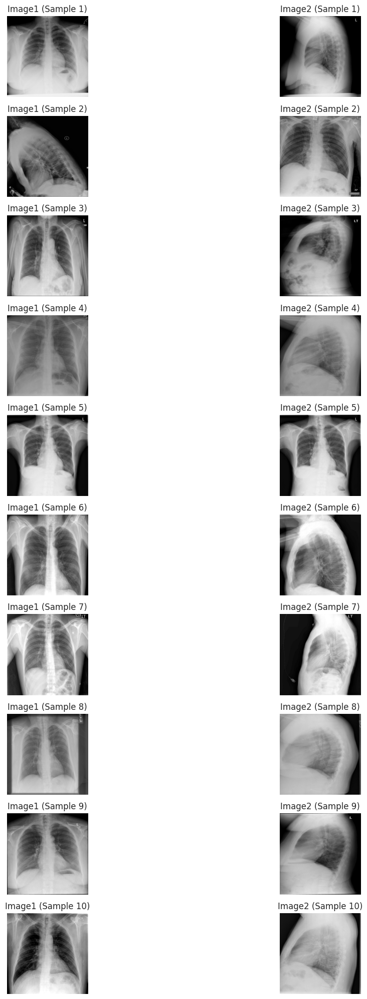

In [25]:
# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Fix random seed for reproducibility within a run
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Load CLIP model and processor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device).eval()
feature_extractor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Load BioBART tokenizer and model
biobart_model_name = "GanjinZero/biobart-base"
biobart_tokenizer = BartTokenizer.from_pretrained(biobart_model_name)
biobart_model = BartForConditionalGeneration.from_pretrained(biobart_model_name).to(device)

# Define MLP class
class MLP(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLP, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, hidden_dim)
        self.dropout1 = torch.nn.Dropout(0.1)
        self.fc2 = torch.nn.Linear(hidden_dim, output_dim)
        self.layer_norm = torch.nn.LayerNorm(output_dim)

    def forward(self, x):
        x = self.fc1(x)
        x = torch.relu(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.layer_norm(x)
        return x

# Initialize MLP
mlp_input_dim = 1024  # Concatenated CLIP features (512 * 2)
mlp_hidden_dim = 1024
mlp_output_dim = biobart_model.config.d_model
mlp = MLP(input_dim=mlp_input_dim, hidden_dim=mlp_hidden_dim, output_dim=mlp_output_dim).to(device)

# Load the best model checkpoint
checkpoint_path = 'vit_biobart_best_model.pt'
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device)
    mlp.load_state_dict(checkpoint['mlp_state_dict'])
    biobart_model.load_state_dict(checkpoint['biobart_state_dict'])
    logger.info(f"Loaded model from {checkpoint_path} (Epoch {checkpoint['epoch']+1}, Val Loss: {checkpoint['val_loss']:.4f})")
else:
    raise FileNotFoundError(f"Checkpoint not found at {checkpoint_path}.")

# Set models to evaluation mode
mlp.eval()
biobart_model.eval()

# Load test dataset
test_dataset = pd.read_csv('/kaggle/input/data-split-csv/Test_Data.csv')
test_images = test_dataset[['Person_id', 'Image1', 'Image2']]
y_test = test_dataset['Report']

# Function to load and preprocess image
def load_image(img_name, base_path="/kaggle/working/xray_images"):
    filename = os.path.basename(img_name.strip())
    full_path = os.path.join(base_path, filename)
    try:
        image = Image.open(full_path)
    except FileNotFoundError:
        logger.warning(f"Image not found: {full_path}")
        return None
    image = image.resize((224, 224))
    image = np.asarray(image.convert("RGB"))
    image = cv2.resize(image, (224, 224))
    return image

# Function to extract CLIP features
def extract_img_feature(image1_path, image2_path, base_path="/kaggle/working/xray_images"):
    def extract_single_feature(image_path):
        image = load_image(image_path, base_path)
        if image is None:
            return None
        inputs = feature_extractor(images=image, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        with torch.no_grad():
            outputs = clip_model.get_image_features(**inputs)
        return outputs.squeeze(0)  # (512,)
    
    img1_features = extract_single_feature(image1_path)
    img2_features = extract_single_feature(image2_path)
    if img1_features is not None and img2_features is not None:
        combined_feature = np.concatenate([img1_features.cpu().numpy(), img2_features.cpu().numpy()], axis=-1)
        logger.debug(f"Extracted features for {image1_path} and {image2_path}: shape {combined_feature.shape}")
        return combined_feature
    logger.warning(f"Failed to extract features for {image1_path} or {image2_path}")
    return None

# Function to generate report
def generate_report(feature_tensor):
    with torch.no_grad():
        print("feature_tensor: ", feature_tensor)
        embedded_input = mlp(feature_tensor)  # Shape: (1, hidden_size)
        print("embedded_input: ", embedded_input)
        sample_embed_gen = embedded_input.unsqueeze(1)  # Shape: (1, 1, hidden_size)
        gen_ids = biobart_model.generate(
            inputs_embeds=sample_embed_gen,
            max_length=100,
            num_beams=4,
            early_stopping=True,
            pad_token_id=biobart_tokenizer.pad_token_id,
            eos_token_id=biobart_tokenizer.eos_token_id,
            # Ensure deterministic generation
            do_sample=False
        )
        generated_text = biobart_tokenizer.decode(gen_ids[0], skip_special_tokens=True).strip()
    return generated_text

# Select 10 random samples
random_indices = random.sample(range(len(test_images)), 10)
selected_samples = test_images.iloc[random_indices]
selected_references = y_test.iloc[random_indices]

# Process samples and generate reports
generated_reports = []
image_pairs = []
feature_norms = []  # To debug feature uniqueness

for idx, row in selected_samples.iterrows():
    feature = extract_img_feature(row['Image1'], row['Image2'])
    if feature is None:
        generated_reports.append("Error: Missing images")
        image_pairs.append((None, None))
        feature_norms.append(None)
        continue
    
    # Normalize features
    mean, std = feature.mean(), feature.std()
    std = std if std > 1e-6 else 1.0
    feature = (feature - mean) / std
    feature_norms.append(np.linalg.norm(feature))  # Track feature norm for debugging
    
    # Convert to tensor
    feature_tensor = torch.tensor(feature).float().unsqueeze(0).to(device)
    
    # Generate report
    generated_text = generate_report(feature_tensor)
    generated_reports.append(generated_text)
    
    # Load images for visualization
    img1 = load_image(row['Image1'])
    img2 = load_image(row['Image2'])
    image_pairs.append((img1, img2))

# Check if generated reports are identical
unique_reports = len(set(generated_reports))
logger.info(f"Number of unique generated reports: {unique_reports}/10")
if unique_reports < 10:
    logger.warning("Generated reports are not unique. Checking feature norms...")
    logger.info(f"Feature norms: {[f if f is None else round(f, 4) for f in feature_norms]}")

# Display results
plt.figure(figsize=(15, 20))
for i, (idx, ref_report, gen_report, (img1, img2)) in enumerate(zip(random_indices, selected_references, generated_reports, image_pairs)):
    print(f"\n--- Sample {i+1} (Person ID: {selected_samples.iloc[i]['Person_id']}) ---")
    print(f"Reference Report: {ref_report.strip()}")
    print(f"Generated Report: {gen_report}")
    print("-" * 50)
    
    # Plot images
    plt.subplot(10, 2, 2*i + 1)
    if img1 is not None:
        plt.imshow(img1)
        plt.title(f"Image1 (Sample {i+1})")
    else:
        plt.text(0.5, 0.5, "Image1 Missing", ha='center', va='center')
    plt.axis('off')
    
    plt.subplot(10, 2, 2*i + 2)
    if img2 is not None:
        plt.imshow(img2)
        plt.title(f"Image2 (Sample {i+1})")
    else:
        plt.text(0.5, 0.5, "Image2 Missing", ha='center', va='center')
    plt.axis('off')

plt.tight_layout()
plt.show()


Starting evaluation on the test set...



Example Generations (Test Set):


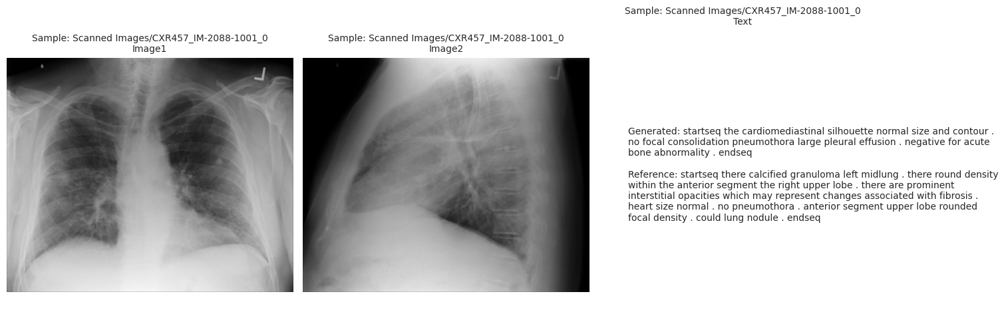


--- Example 1 (Sample: Scanned Images/CXR457_IM-2088-1001_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq there calcified granuloma left midlung . there round density within the anterior segment the right upper lobe . there are prominent interstitial opacities which may represent changes associated with fibrosis . heart size normal . no pneumothora . anterior segment upper lobe rounded focal density . could lung nodule . endseq
-----------------


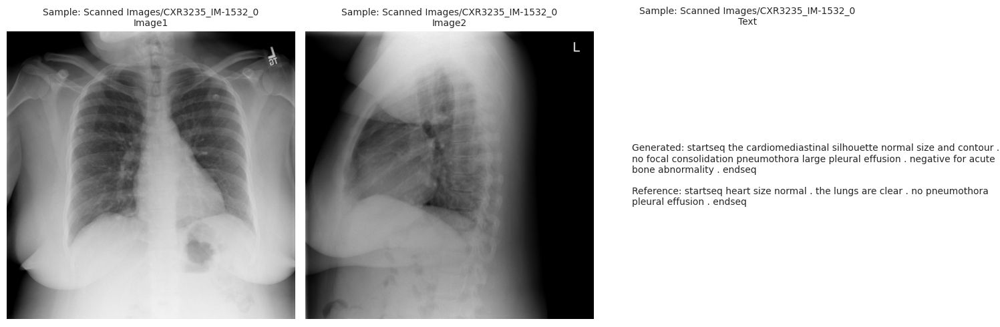


--- Example 2 (Sample: Scanned Images/CXR3235_IM-1532_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq heart size normal . the lungs are clear . no pneumothora pleural effusion . endseq
-----------------


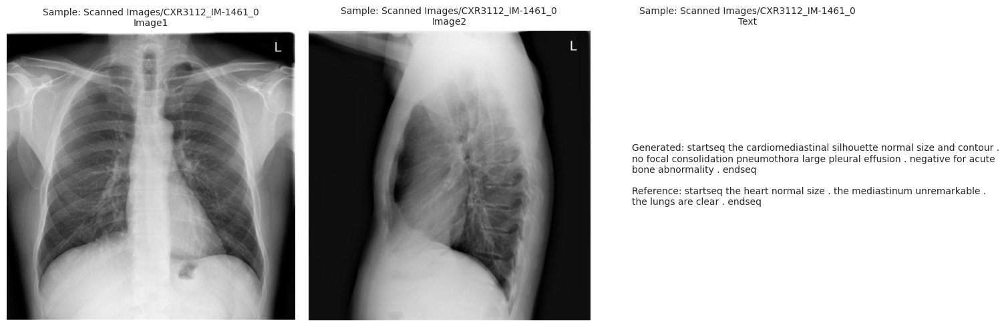


--- Example 3 (Sample: Scanned Images/CXR3112_IM-1461_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the heart normal size . the mediastinum unremarkable . the lungs are clear . endseq
-----------------


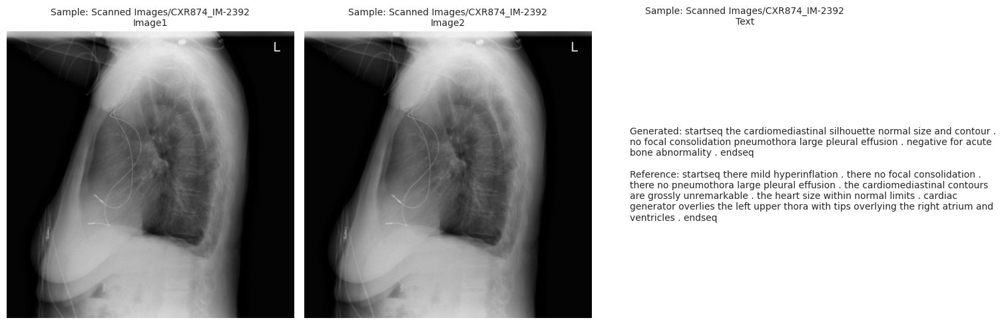


--- Example 4 (Sample: Scanned Images/CXR874_IM-2392) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq there mild hyperinflation . there no focal consolidation . there no pneumothora large pleural effusion . the cardiomediastinal contours are grossly unremarkable . the heart size within normal limits . cardiac generator overlies the left upper thora with tips overlying the right atrium and ventricles . endseq
-----------------


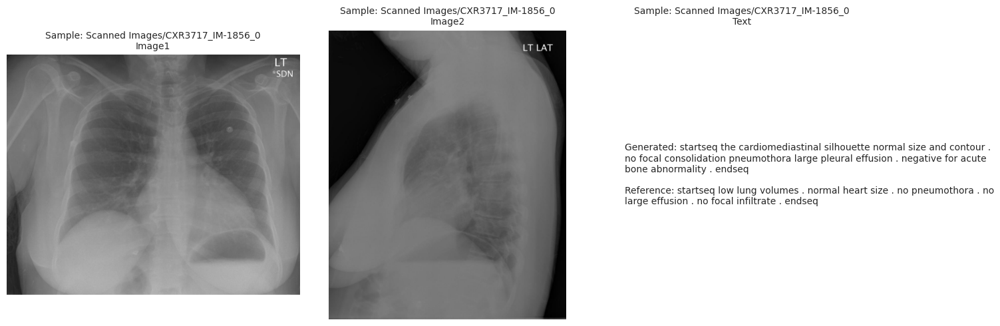


--- Example 5 (Sample: Scanned Images/CXR3717_IM-1856_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq low lung volumes . normal heart size . no pneumothora . no large effusion . no focal infiltrate . endseq
-----------------


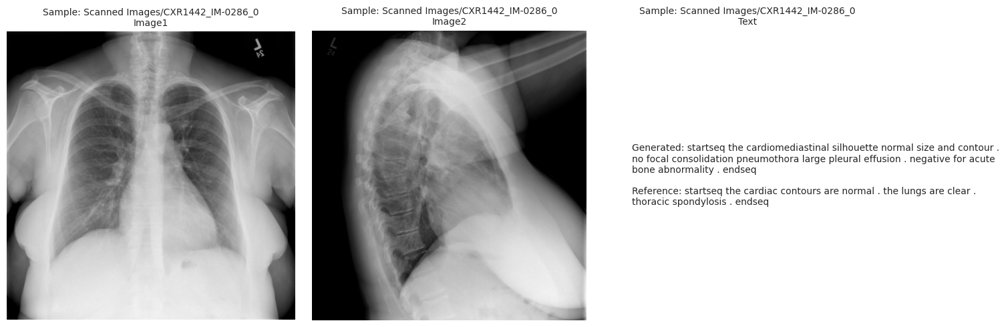


--- Example 6 (Sample: Scanned Images/CXR1442_IM-0286_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the cardiac contours are normal . the lungs are clear . thoracic spondylosis . endseq
-----------------


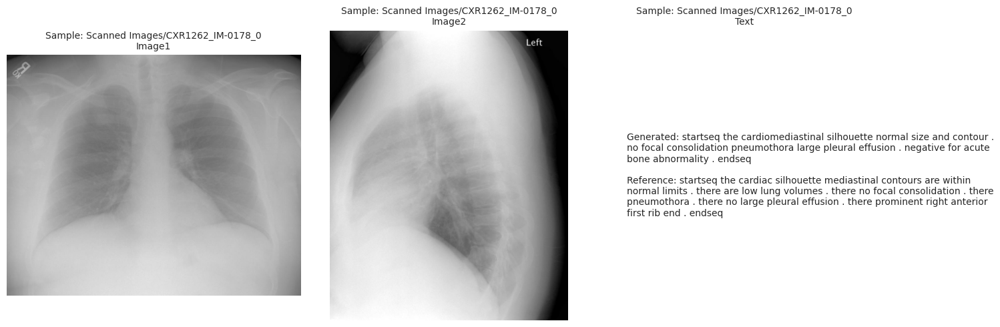


--- Example 7 (Sample: Scanned Images/CXR1262_IM-0178_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the cardiac silhouette mediastinal contours are within normal limits . there are low lung volumes . there no focal consolidation . there pneumothora . there no large pleural effusion . there prominent right anterior first rib end . endseq
-----------------


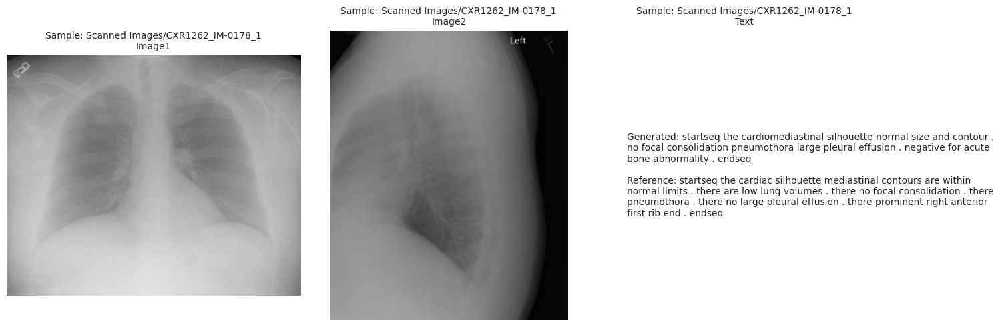


--- Example 8 (Sample: Scanned Images/CXR1262_IM-0178_1) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the cardiac silhouette mediastinal contours are within normal limits . there are low lung volumes . there no focal consolidation . there pneumothora . there no large pleural effusion . there prominent right anterior first rib end . endseq
-----------------


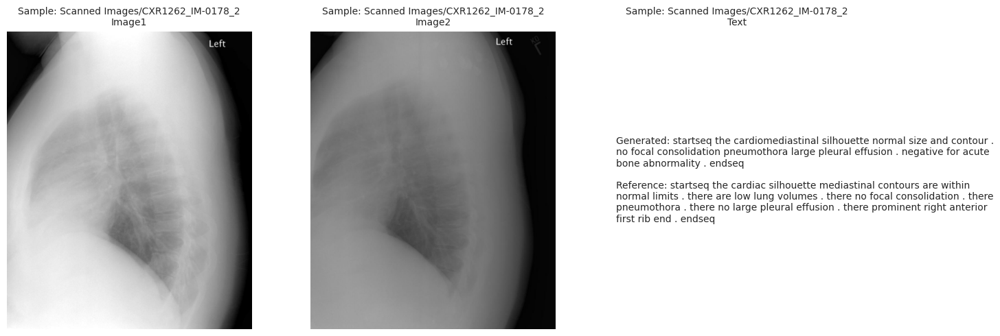


--- Example 9 (Sample: Scanned Images/CXR1262_IM-0178_2) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the cardiac silhouette mediastinal contours are within normal limits . there are low lung volumes . there no focal consolidation . there pneumothora . there no large pleural effusion . there prominent right anterior first rib end . endseq
-----------------


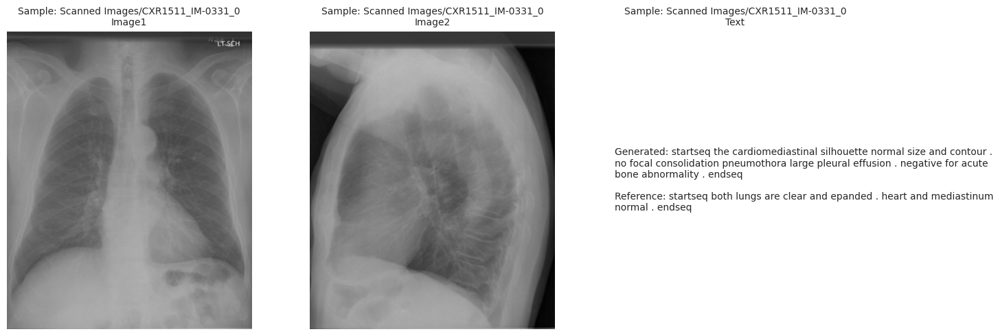


--- Example 10 (Sample: Scanned Images/CXR1511_IM-0331_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq both lungs are clear and epanded . heart and mediastinum normal . endseq
-----------------


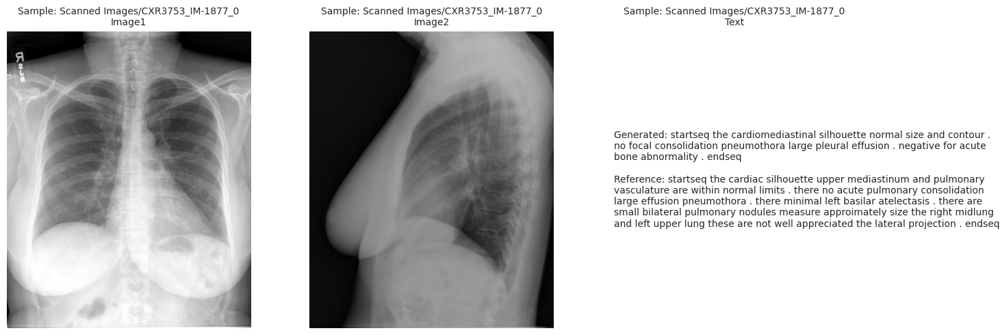


--- Example 11 (Sample: Scanned Images/CXR3753_IM-1877_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the cardiac silhouette upper mediastinum and pulmonary vasculature are within normal limits . there no acute pulmonary consolidation large effusion pneumothora . there minimal left basilar atelectasis . there are small bilateral pulmonary nodules measure approimately size the right midlung and left upper lung these are not well appreciated the lateral projection . endseq
-----------------


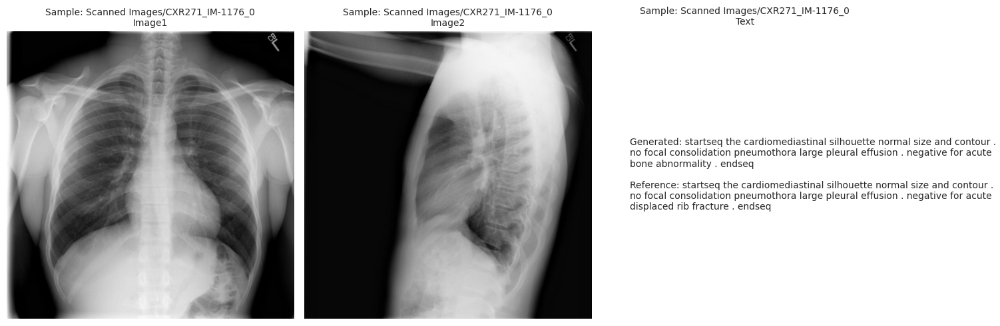


--- Example 12 (Sample: Scanned Images/CXR271_IM-1176_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute displaced rib fracture . endseq
-----------------


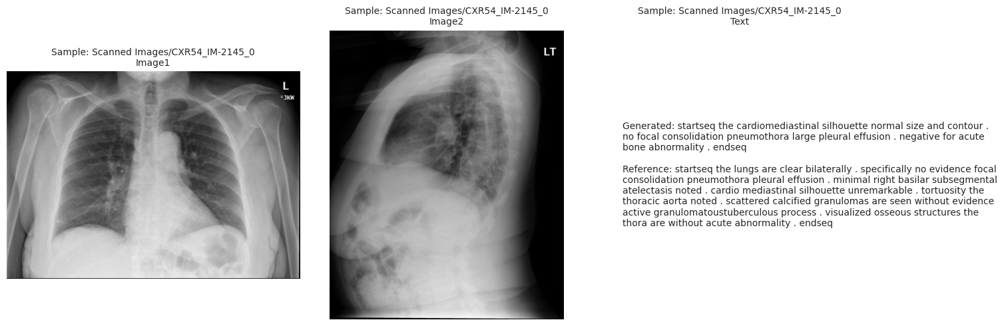


--- Example 13 (Sample: Scanned Images/CXR54_IM-2145_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the lungs are clear bilaterally . specifically no evidence focal consolidation pneumothora pleural effusion . minimal right basilar subsegmental atelectasis noted . cardio mediastinal silhouette unremarkable . tortuosity the thoracic aorta noted . scattered calcified granulomas are seen without evidence active granulomatoustuberculous process . visualized osseous structures the thora are without acute abnormality . endseq
-----------------


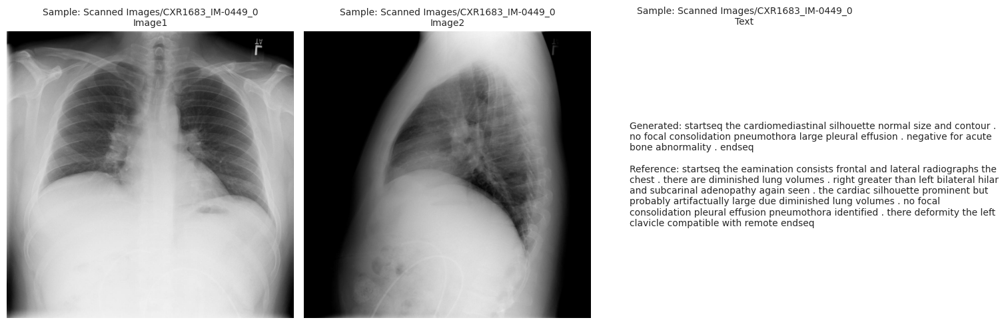


--- Example 14 (Sample: Scanned Images/CXR1683_IM-0449_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the eamination consists frontal and lateral radiographs the chest . there are diminished lung volumes . right greater than left bilateral hilar and subcarinal adenopathy again seen . the cardiac silhouette prominent but probably artifactually large due diminished lung volumes . no focal consolidation pleural effusion pneumothora identified . there deformity the left clavicle compatible with remote endseq
-----------------


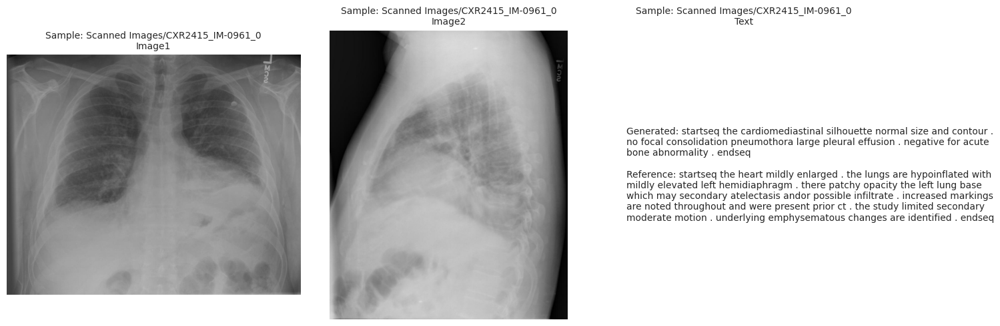


--- Example 15 (Sample: Scanned Images/CXR2415_IM-0961_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the heart mildly enlarged . the lungs are hypoinflated with mildly elevated left hemidiaphragm . there patchy opacity the left lung base which may secondary atelectasis andor possible infiltrate . increased markings are noted throughout and were present prior ct . the study limited secondary moderate motion . underlying emphysematous changes are identified . endseq
-----------------


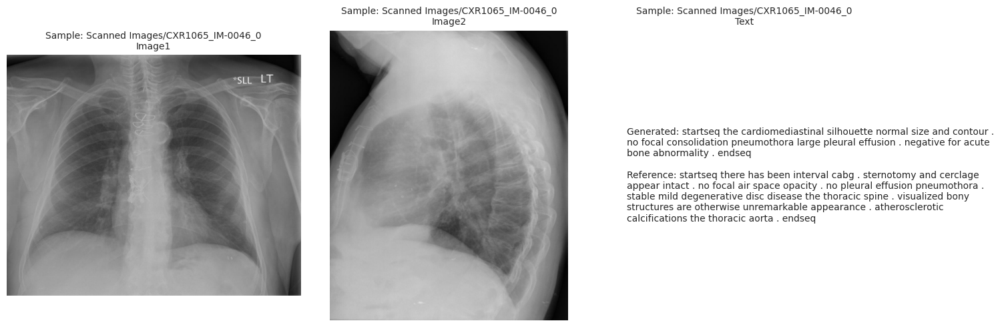


--- Example 16 (Sample: Scanned Images/CXR1065_IM-0046_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq there has been interval cabg . sternotomy and cerclage appear intact . no focal air space opacity . no pleural effusion pneumothora . stable mild degenerative disc disease the thoracic spine . visualized bony structures are otherwise unremarkable appearance . atherosclerotic calcifications the thoracic aorta . endseq
-----------------


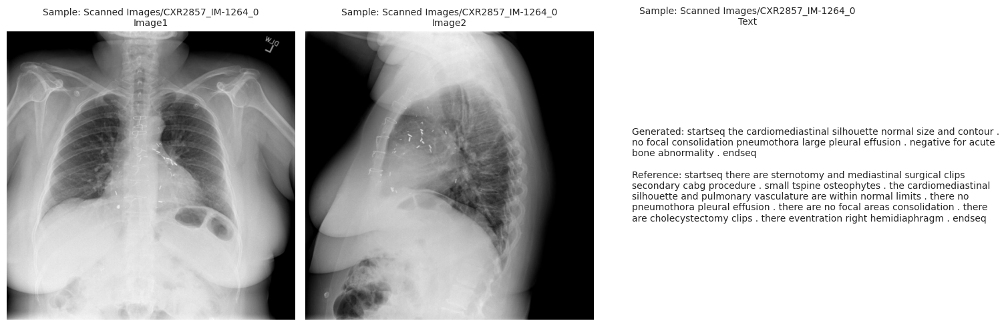


--- Example 17 (Sample: Scanned Images/CXR2857_IM-1264_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq there are sternotomy and mediastinal surgical clips secondary cabg procedure . small tspine osteophytes . the cardiomediastinal silhouette and pulmonary vasculature are within normal limits . there no pneumothora pleural effusion . there are no focal areas consolidation . there are cholecystectomy clips . there eventration right hemidiaphragm . endseq
-----------------


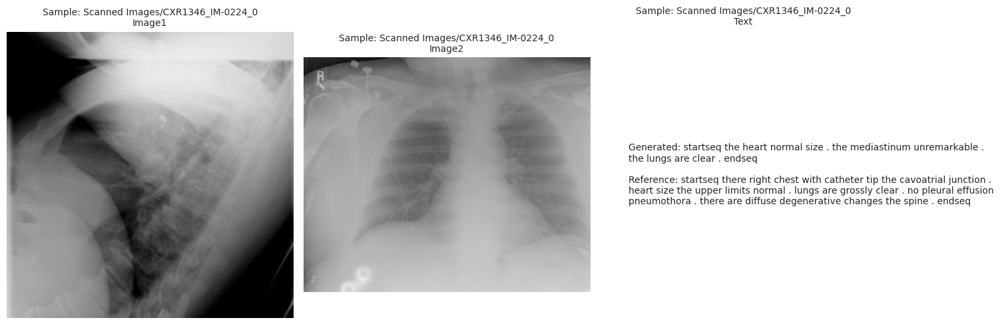


--- Example 18 (Sample: Scanned Images/CXR1346_IM-0224_0) ---
Generated: startseq the heart normal size . the mediastinum unremarkable . the lungs are clear . endseq
Reference: startseq there right chest with catheter tip the cavoatrial junction . heart size the upper limits normal . lungs are grossly clear . no pleural effusion pneumothora . there are diffuse degenerative changes the spine . endseq
-----------------


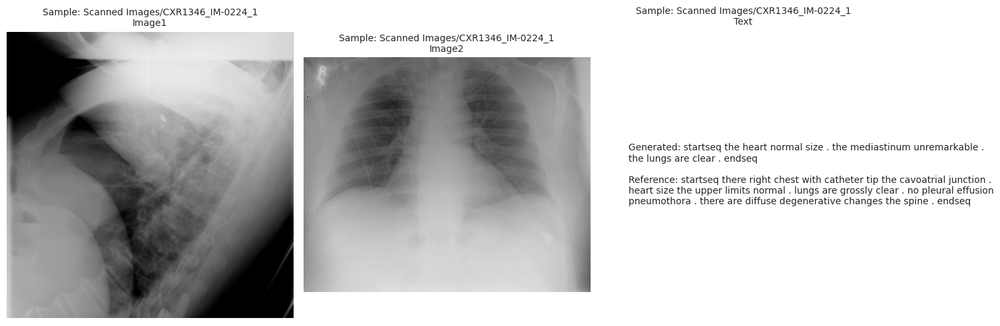


--- Example 19 (Sample: Scanned Images/CXR1346_IM-0224_1) ---
Generated: startseq the heart normal size . the mediastinum unremarkable . the lungs are clear . endseq
Reference: startseq there right chest with catheter tip the cavoatrial junction . heart size the upper limits normal . lungs are grossly clear . no pleural effusion pneumothora . there are diffuse degenerative changes the spine . endseq
-----------------


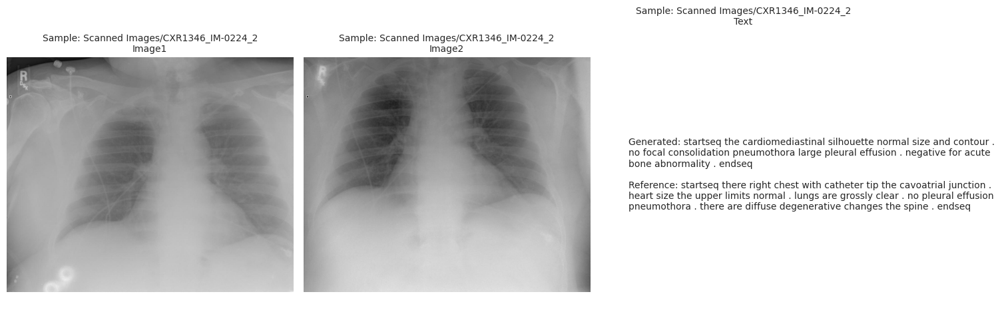


--- Example 20 (Sample: Scanned Images/CXR1346_IM-0224_2) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq there right chest with catheter tip the cavoatrial junction . heart size the upper limits normal . lungs are grossly clear . no pleural effusion pneumothora . there are diffuse degenerative changes the spine . endseq
-----------------


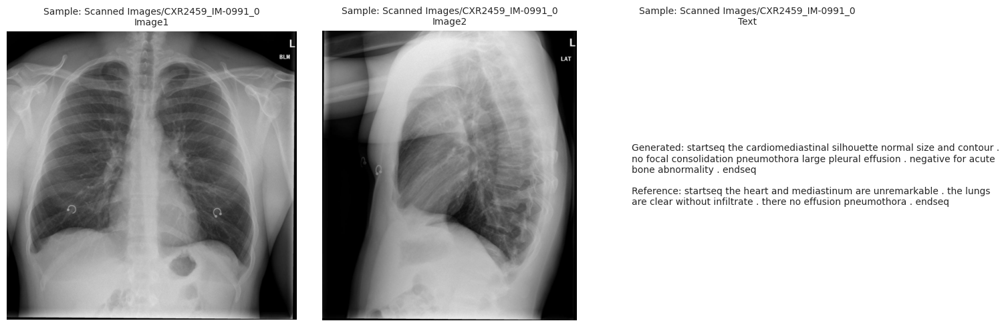


--- Example 21 (Sample: Scanned Images/CXR2459_IM-0991_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the heart and mediastinum are unremarkable . the lungs are clear without infiltrate . there no effusion pneumothora . endseq
-----------------


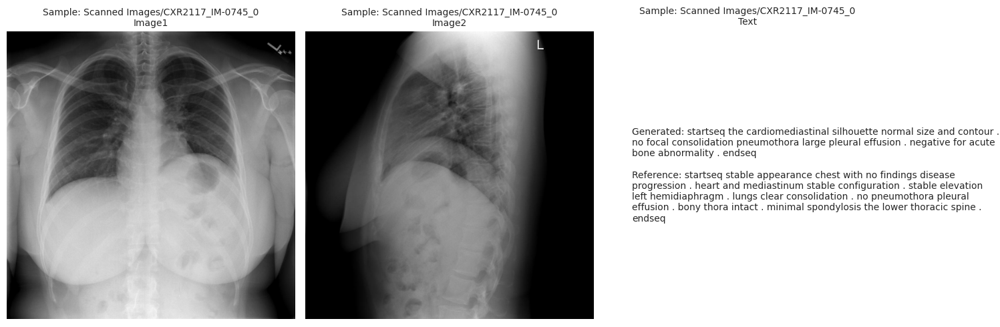


--- Example 22 (Sample: Scanned Images/CXR2117_IM-0745_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq stable appearance chest with no findings disease progression . heart and mediastinum stable configuration . stable elevation left hemidiaphragm . lungs clear consolidation . no pneumothora pleural effusion . bony thora intact . minimal spondylosis the lower thoracic spine . endseq
-----------------


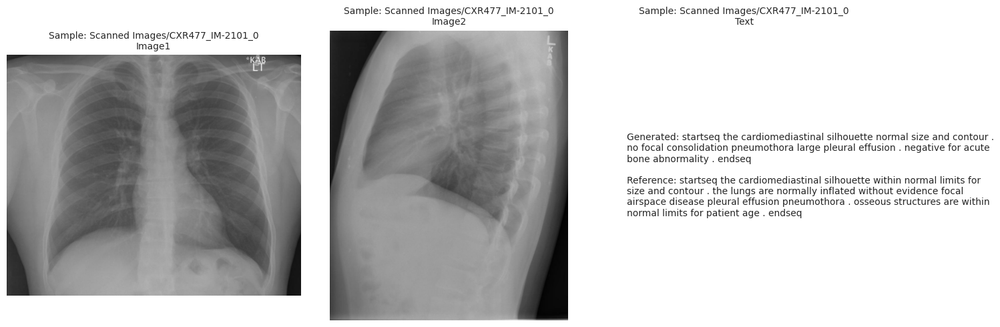


--- Example 23 (Sample: Scanned Images/CXR477_IM-2101_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the cardiomediastinal silhouette within normal limits for size and contour . the lungs are normally inflated without evidence focal airspace disease pleural effusion pneumothora . osseous structures are within normal limits for patient age . endseq
-----------------


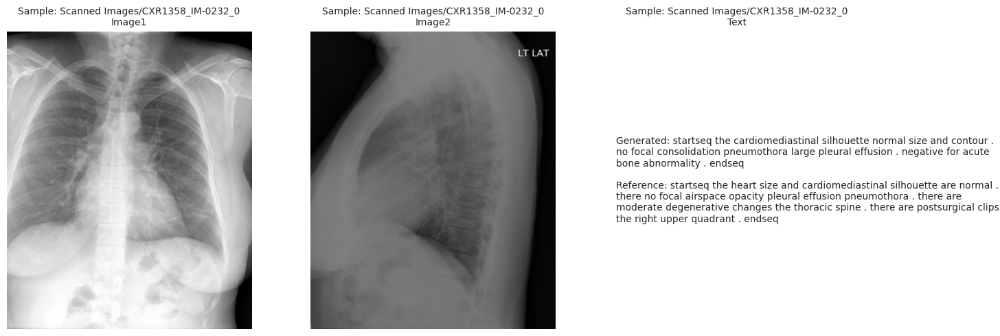


--- Example 24 (Sample: Scanned Images/CXR1358_IM-0232_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the heart size and cardiomediastinal silhouette are normal . there no focal airspace opacity pleural effusion pneumothora . there are moderate degenerative changes the thoracic spine . there are postsurgical clips the right upper quadrant . endseq
-----------------


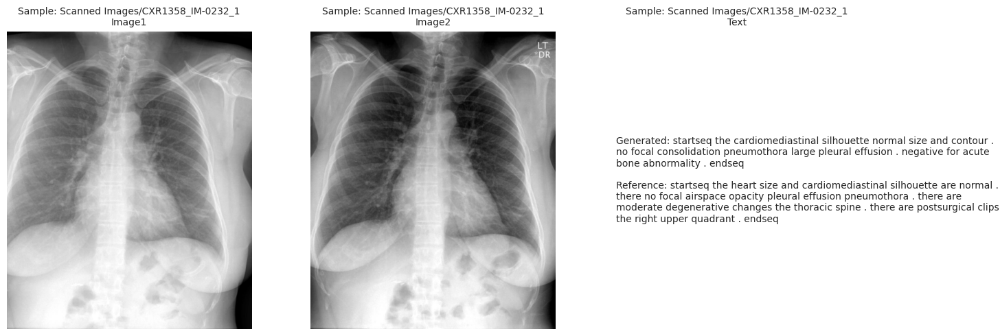


--- Example 25 (Sample: Scanned Images/CXR1358_IM-0232_1) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the heart size and cardiomediastinal silhouette are normal . there no focal airspace opacity pleural effusion pneumothora . there are moderate degenerative changes the thoracic spine . there are postsurgical clips the right upper quadrant . endseq
-----------------


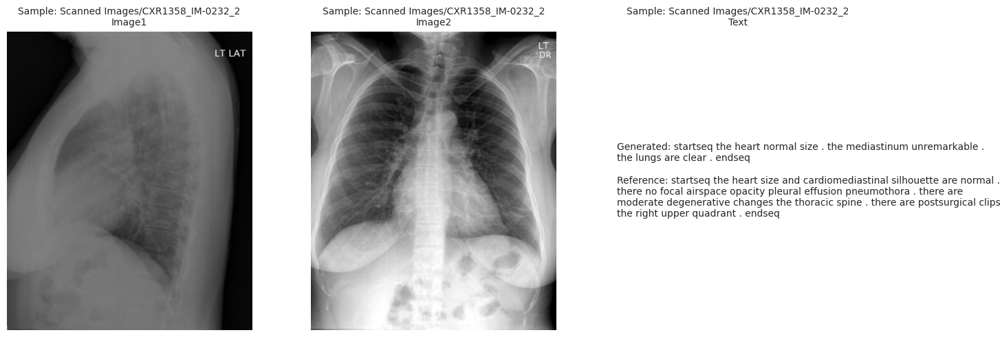


--- Example 26 (Sample: Scanned Images/CXR1358_IM-0232_2) ---
Generated: startseq the heart normal size . the mediastinum unremarkable . the lungs are clear . endseq
Reference: startseq the heart size and cardiomediastinal silhouette are normal . there no focal airspace opacity pleural effusion pneumothora . there are moderate degenerative changes the thoracic spine . there are postsurgical clips the right upper quadrant . endseq
-----------------


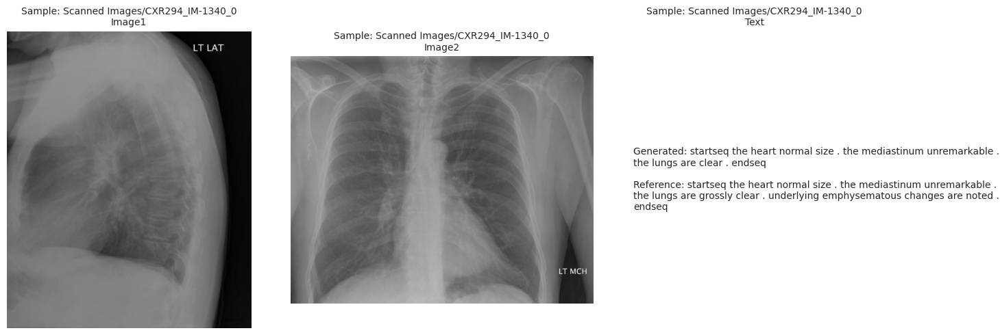


--- Example 27 (Sample: Scanned Images/CXR294_IM-1340_0) ---
Generated: startseq the heart normal size . the mediastinum unremarkable . the lungs are clear . endseq
Reference: startseq the heart normal size . the mediastinum unremarkable . the lungs are grossly clear . underlying emphysematous changes are noted . endseq
-----------------


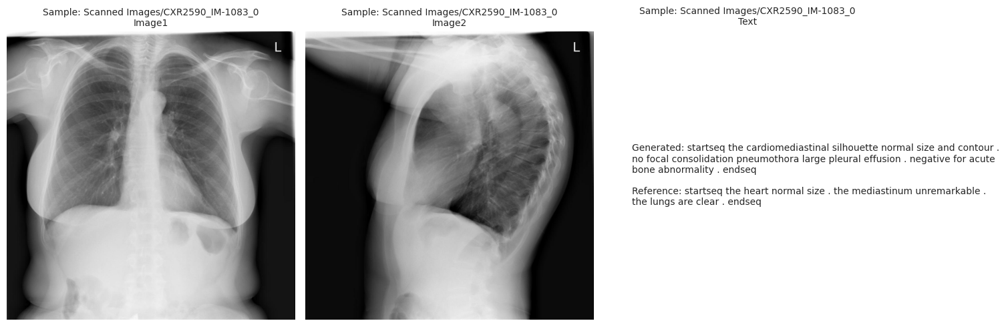


--- Example 28 (Sample: Scanned Images/CXR2590_IM-1083_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq the heart normal size . the mediastinum unremarkable . the lungs are clear . endseq
-----------------


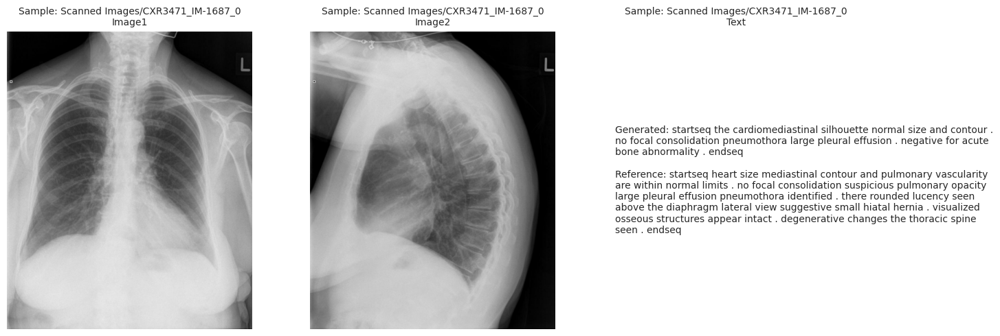


--- Example 29 (Sample: Scanned Images/CXR3471_IM-1687_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq heart size mediastinal contour and pulmonary vascularity are within normal limits . no focal consolidation suspicious pulmonary opacity large pleural effusion pneumothora identified . there rounded lucency seen above the diaphragm lateral view suggestive small hiatal hernia . visualized osseous structures appear intact . degenerative changes the thoracic spine seen . endseq
-----------------


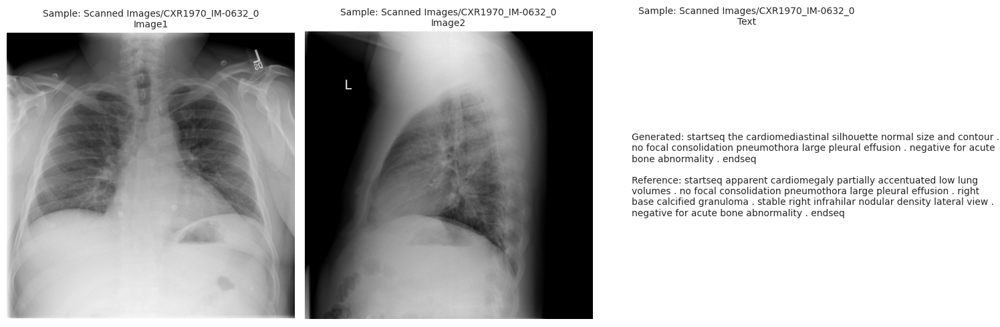


--- Example 30 (Sample: Scanned Images/CXR1970_IM-0632_0) ---
Generated: startseq the cardiomediastinal silhouette normal size and contour . no focal consolidation pneumothora large pleural effusion . negative for acute bone abnormality . endseq
Reference: startseq apparent cardiomegaly partially accentuated low lung volumes . no focal consolidation pneumothora large pleural effusion . right base calcified granuloma . stable right infrahilar nodular density lateral view . negative for acute bone abnormality . endseq
-----------------

Calculating BLEU scores...


In [28]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# --- Đánh giá và lưu trữ thông tin ảnh cùng Person_id ---
generated_texts = []
reference_texts = []
image_paths = []  # Lưu trữ đường dẫn ảnh (Image1, Image2)
person_ids = []  # Lưu trữ Person_id

print("\nStarting evaluation on the test set...")
# Đảm bảo ánh xạ đúng thứ tự mẫu
test_image_paths = test_images[['Image1', 'Image2']].values.tolist()  # Lấy danh sách [Image1, Image2]
test_person_ids = test_images['Person_id'].values.tolist()  # Lấy danh sách Person_id
current_idx = 0  # Chỉ số để theo dõi mẫu trong test_loader

with torch.no_grad():
    progress_bar = tqdm(test_loader, desc='Evaluating', leave=False)
    for input_batch, label_batch in progress_bar:
        input_batch = input_batch.to(device)  # torch.Size([16, 1024])
        
        # --- Generate Predictions ---
        embedded_input = mlp(input_batch)  # Shape: (batch_size, hidden_size)
        embedded_input_gen = embedded_input.unsqueeze(1)  # Shape: (batch_size, 1, hidden_size)
        
        try:
            outputs = biobart_model.generate(
                inputs_embeds=embedded_input_gen,
                max_length=153,
                num_beams=4,
                early_stopping=True,
                pad_token_id=biobart_tokenizer.pad_token_id,
                eos_token_id=biobart_tokenizer.eos_token_id,
            )
            
            # --- Decode và lưu trữ ---
            batch_generated_texts = biobart_tokenizer.batch_decode(outputs, skip_special_tokens=True)
            batch_reference_texts = biobart_tokenizer.batch_decode(label_batch, skip_special_tokens=True)
            
            # Lưu văn bản, đường dẫn ảnh, và Person_id
            batch_size = len(batch_generated_texts)
            for i in range(batch_size):
                generated_texts.append(batch_generated_texts[i].strip())
                reference_texts.append(batch_reference_texts[i].strip())
                if current_idx < len(test_image_paths):
                    image_paths.append(test_image_paths[current_idx])
                    person_ids.append(test_person_ids[current_idx])
                    current_idx += 1
            
        except RuntimeError as e:
            if "out of memory" in str(e):
                print(f"\nCUDA OOM during evaluation. Skipping batch.")
                torch.cuda.empty_cache()
                continue
            else:
                print(f"Runtime Error during evaluation: {str(e)}")
                raise e
        
        if device == torch.device("cuda") and progress_bar.n % 20 == 0:
            torch.cuda.empty_cache()
    
    progress_bar.close()

# --- Hiển thị từng mẫu riêng biệt ---
print("\nExample Generations (Test Set):")
num_examples = min(30, len(generated_texts))  # Hiển thị tối đa 5 ví dụ

base_path = "/kaggle/working/xray_images"

for i in range(num_examples):
    # --- Chuẩn bị ảnh ---
    img1_path = os.path.join(base_path, os.path.basename(image_paths[i][0].strip()))
    img2_path = os.path.join(base_path, os.path.basename(image_paths[i][1].strip()))
    
    try:
        img1 = Image.open(img1_path).convert("RGB")
        img2 = Image.open(img2_path).convert("RGB")
    except FileNotFoundError:
        print(f"⚠️ Không tìm thấy ảnh: {img1_path} hoặc {img2_path}")
        img1 = Image.new('RGB', (224, 224), color='gray')  # Ảnh placeholder
        img2 = Image.new('RGB', (224, 224), color='gray')
    
    # --- Lấy Person_id ---
    person_id = person_ids[i] if i < len(person_ids) else "Unknown"

    # --- Tạo figure riêng cho mẫu này ---
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Hiển thị Image1
    axes[0].imshow(img1)
    axes[0].set_title(f"Sample: {person_id}\nImage1", fontsize=10)
    axes[0].axis('off')
    
    # Hiển thị Image2
    axes[1].imshow(img2)
    axes[1].set_title(f"Sample: {person_id}\nImage2", fontsize=10)
    axes[1].axis('off')
    
    # Hiển thị văn bản
    text = f"Generated: {generated_texts[i]}\n\nReference: {reference_texts[i]}"
    axes[2].text(0.1, 0.5, text, fontsize=10, verticalalignment='center', wrap=True)
    axes[2].set_title(f"Sample: {person_id}\nText", fontsize=10)
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # --- In văn bản sau mỗi biểu đồ ---
    print(f"\n--- Example {i+1} (Sample: {person_id}) ---")
    print(f"Generated: {generated_texts[i]}")
    print(f"Reference: {reference_texts[i]}")
    print("-----------------")

# --- Tính toán BLEU (giữ nguyên) ---
if not generated_texts or not reference_texts:
    print("Evaluation failed: No texts were generated or references found.")
else:
    print("\nCalculating BLEU scores...")
    generated_tokens = [word_tokenize(text.lower()) for text in generated_texts]
    reference_tokens = [[word_tokenize(text.lower())] for text in reference_texts]